In [13]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [14]:
# Discard the output of this cell.
#%capture

# Install the required libraries.
!pip install pafy youtube-dl moviepy

# Import the required libraries.
import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model


#### Additionally, there is a description of the first step in the project:
#### Step 1: Download and Visualize the Data with its Labels
#### The dataset used is the UCF50 - Action Recognition Dataset, which contains:
#### 50 Action Categories
#### 25 Groups of Videos per Action Category
#### 133 Average Videos per Action Category
#### 199 Average Frames per Video
#### 320 Average Frame Width per Video
#### 240 Average Frame Height per Video

In [15]:
#And will set NumPy, Python, and TensorFlow seeds to get consistent results on every execution.
import numpy as np
import random
import tensorflow as tf

seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)


In [16]:
# Discard the output of this cell.
#%capture

# Download the UCF50 Dataset
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

# Extract the Dataset
!unrar x UCF50.rar

# For visualization, we will pick 20 random categories from the dataset and a random video from each selected category.
# We will visualize the first frame of the selected videos with their associated labels written.
# This way we'll be able to visualize a subset (20 random videos) of the dataset.

# Create a Matplotlib figure and specify the size of the figure.
plt.figure(figsize=(20, 20))

# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('UCF50')

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
Extracting  UCF50/HorseRace/v_HorseRace_g16_c03.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g16_c04.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g16_c05.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c01.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c02.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c03.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c04.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c05.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g18_c01.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g18_c02.avi                       23%  OK 
Ex

<Figure size 2000x2000 with 0 Axes>

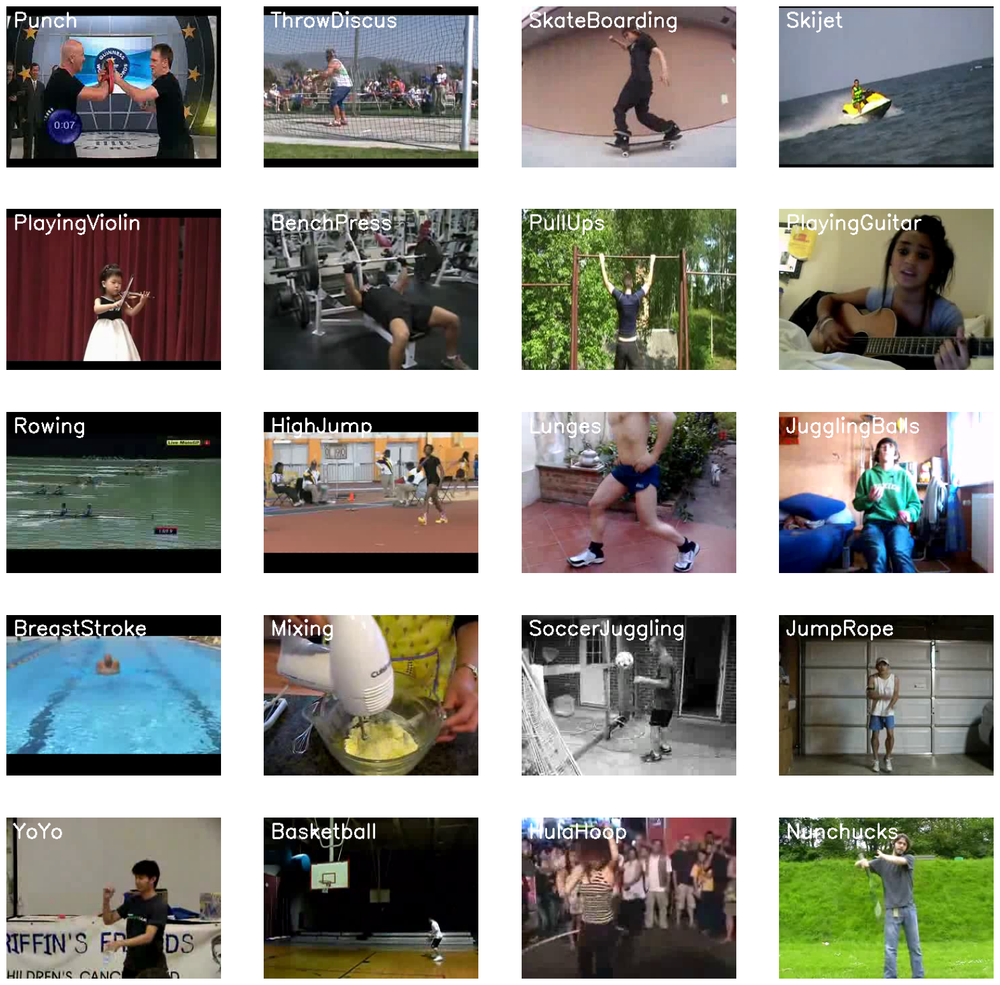

In [18]:
# Create a Matplotlib figure and specify the size of the figure.
plt.figure(figsize=(20, 20))

# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('UCF50')

# Generate a list of 20 random values. The values will be between 0 and 50,
# where 50 is the total number of classes in the dataset.
random_range = random.sample(range(len(all_classes_names)), 20)

# Iterating through all the generated random values.
for counter, random_index in enumerate(random_range, 1):
    # Retrieve a Class Name using the Random Index.
    selected_class_name = all_classes_names[random_index]

    # Retrieve the list of all the video files present in the randomly selected Class Directory.
    # Use os.path.join to construct the correct path
    video_files_names_list = os.listdir(os.path.join('UCF50', selected_class_name))

    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)

    # Initialize a VideoCapture object to read from the video file.
    # Use os.path.join to construct the correct path
    video_reader = cv2.VideoCapture(os.path.join('UCF50', selected_class_name, selected_video_file_name))

    # Read the first frame of the video file.
    _, bgr_frame = video_reader.read()

    # Release the VideoCapture object.
    video_reader.release()

    # Convert the frame from BGR into RGB format.
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Write the class name on the video frame.
    cv2.putText(rgb_frame, selected_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Display the frame.
    plt.subplot(5, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')

# Step 2: Preprocess the Dataset

In [19]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 20

# Specify the directory containing the UCF50 dataset.
DATASET_DIR = "/content/drive/MyDrive/Dossier sans titre/UCF50"

# Specify the list containing the names of the classes used for training.
# Feel free to choose any set of classes.
CLASSES_LIST = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]

# Note: The IMAGE_HEIGHT, IMAGE_WIDTH, and SEQUENCE_LENGTH constants can be increased for better results.
# However, increasing the sequence length or frame size will make the process more computationally expensive.


# Create function to resize and normalize frames

In [20]:
def frames_extraction(video_path):
    #declare a list to store video frames
    frames_list = []
    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video.
        success, frame = video_reader.read()

        # Check if Video frame is not successfully read then break the loop.
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Append the normalized frame into the frames list.
        frames_list.append(normalized_frame)

    # Release the VideoCapture object.
    video_reader.release()

    # Return the frames list.
    return frames_list



# Create a function for dataset creation

In [21]:
def create_dataset():
    """
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features: A list containing the extracted frames of the videos.
        labels: A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    """
    # Declare Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes mentioned in the classes list.
    for class_index, class_name in enumerate(CLASSES_LIST):
        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')

        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        # Iterate through all the files present in the files list.
        for file_name in files_list:
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the videos having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:
                # Append the data to their respective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Converting the list to numpy arrays.
    features = np.array(features)
    labels = np.array(labels)

    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths


In [22]:
#create the dataset

features, labels, video_files_paths = create_dataset()


Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing
Extracting Data of Class: HorseRace


In [23]:
#Using keras's to categorical methode to convert labels to one hot-encoded-vectors
one_hot_encoded_labels = to_categorical(labels)

# Split the data into train and test set  

In [24]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

# Split the Data into Train (75%) and Test (25%)
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.25, shuffle = True,
                                                                            random_state = seed_constant)


# construct the model

In [25]:
def create_convlstm_model():
    """
    This function will construct the required convlstm model.
    Returns:
        model: It is the required constructed convlstm model.
    """
    # We will use a Sequential model for model construction
    model = Sequential()

    # Define the Model Architecture
    #########################################
    model.add(ConvLSTM2D(filters=4, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                         recurrent_dropout=0.2, return_sequences=True, input_shape=(SEQUENCE_LENGTH,
                                                                                   IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format="channels_last"))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters=8, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                     recurrent_dropout=0.2, return_sequences=True))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format="channels_last"))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters=14, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                     recurrent_dropout=0.2, return_sequences=True))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format="channels_last"))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters=16, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                     recurrent_dropout=0.2, return_sequences=True))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format="channels_last"))
    # model.add(TimeDistributed(Dropout(0.2)))

    model.add(Flatten())
    model.add(Dense(len(CLASSES_LIST), activation="softmax"))

    # Display the model's summary.
    model.summary()

    # Return the constructed convlstm model.
    return model







In [26]:
#Construct the required convlstm model
convlstm_model = create_convlstm_model()

#display the success message
print("Model Created Successfully!")

  super().__init__(**kwargs)



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)             │ (None, 20, 62, 62, 4)       │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d (MaxPooling3D)         │ (None, 20, 31, 31, 4)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 20, 31, 31, 4)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)           │ (None, 20, 29, 29, 8)       │           3,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_1 (MaxPooling3D)       │ (None, 20, 15, 15, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 20, 15, 15, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_2 (ConvLSTM2D)           │ (None, 20, 13, 13, 14)      │          11,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_2 (MaxPooling3D)       │ (None, 20, 7, 7, 14)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 20, 7, 7, 14)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_3 (ConvLSTM2D)           │ (None, 20, 5, 5, 16)        │          17,344 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_3 (MaxPooling3D)       │ (None, 20, 3, 3, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2880)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4)                   │          11,524 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,524 (173.92 KB)

 Trainable params: 44,524 (173.92 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


**Check the model structure**
Now we will use the function, to check the structure of the constructed model. this is helpful while constructing a complex
network and making that the network is created correctly.

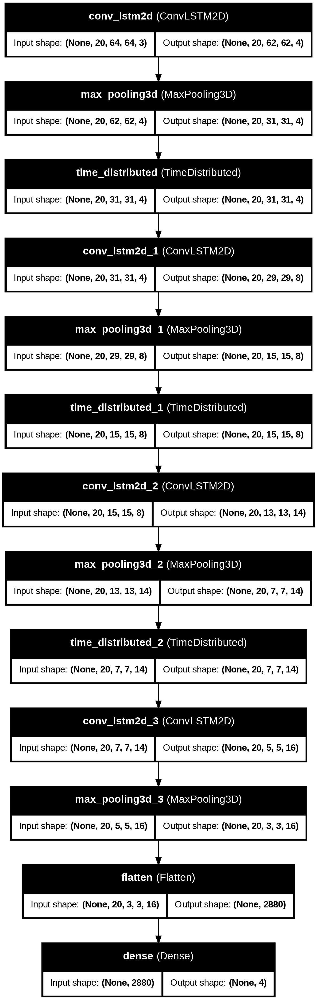

In [27]:
#Plot the structure of the constructed model
plot_model(convlstm_model, to_file='convlstm_model_structure_plot.png', show_shapes=True, show_layer_names=True)

**Compile and Train the model**

In [28]:
#create an intence of early stopping callback
early_Stopping_callback = EarlyStopping(monitor='val_loss', patience=10, mode='min', restore_best_weights=True)

#compile the model and specify the loss function, optimizer and metrics values to the model
convlstm_model.compile(loss="categorical_crossentropy", optimizer="Adam", metrics=["accuracy"])

#start training the model
convlstm_model_training_history = convlstm_model.fit(x=features_train, y=labels_train, epochs=50, batch_size=4,
                                                    shuffle=True, validation_split=0.2,
                                                    callbacks=[early_Stopping_callback])

Epoch 1/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.2330 - loss: 1.3960 - val_accuracy: 0.2603 - val_loss: 1.3869
Epoch 2/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 206s 2s/step - accuracy: 0.2822 - loss: 1.3837 - val_accuracy: 0.4110 - val_loss: 1.3731
Epoch 3/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - accuracy: 0.3074 - loss: 1.3753 - val_accuracy: 0.4247 - val_loss: 1.3713
Epoch 4/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.3876 - loss: 1.2520 - val_accuracy: 0.5890 - val_loss: 0.9190
Epoch 5/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - accuracy: 0.5379 - loss: 1.1024 - val_accuracy: 0.6301 - val_loss: 0.7476
Epoch 6/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 162s 2s/step - accuracy: 0.6609 - loss: 0.7873 - val_accuracy: 0.5890 - val_loss: 0.9180
Epoch 7/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 200s 2s/step - accuracy: 0.7303 - loss: 0.6661 - val_accuracy: 0.6164 - val_loss: 0.9094
Epoch 8/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 207s 2s/step - accuracy: 0.7223 - loss: 0.6625 - val_accuracy: 0.6027 - v

**Evaluate the Trained model**
after training. we will evaluate the model on the test set.

In [29]:
#Evaluate the trained model
Model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

4/4 ━━━━━━━━━━━━━━━━━━━━ 15s 4s/step - accuracy: 0.8469 - loss: 0.4320


**SAVE THE MODEL**

Now we will save the model to avoid trainin it from scratch every tme we need the model.

In [30]:
#Get the loss and accuracy from model_evaluation_history
model_evaluation_loss, model_evaluation_accuracy = Model_evaluation_history

date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

#Define a useful name for our model to make it easy for us while navigating through •ultiDle saved models.
model_file_name = f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

#Save the Model
convlstm_model.save(model_file_name)

**Plot Model's Loss & Accuracy Curves**

Now we will create a function to visualize the training and validation metrics. We already have separate metrics from our
training and validation steps so now we just have to visualize them.

In [31]:
def plot_metric(metric_name_1, metric_name_2, plot_name):

  #Get metric values using metric names as identifiers
  metric_value_1 = convlstm_model_training_history.history[metric_name_1]
  metric_value_2 = convlstm_model_training_history.history[metric_name_2]

  # Construct a range object which will be used as x-axis (horizontal plane) of the graph.

  epochs = range(len(metric_value_1))

  #plot graph
  plt.plot(epochs, metric_value_1, 'blue', label=metric_name_1)
  plt.plot(epochs, metric_value_2, 'red', label=metric_name_2)

  #add title
  plt.title(str(plot_name))

  #add legend
  plt.legend()

This function Kill plot the netrics passed to it in a graph.
ags:


*   model _ training_history: A history Object containing a record Of training and validation loss values and •etrics values at successive epochs
*   metric nane 1:The name of the first netric that needs to be plotted in the graph.


*   metric nane 2: The name of the second netric that needs to be plotted in the graph.
*   plot_name:The title of the graph.












**Now we Will utilize the function plot_metrics created above, to viusuailze and understand the metrics.**

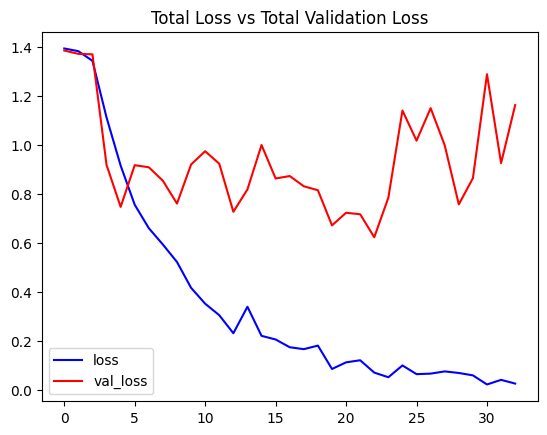

In [32]:
#visualize the training and validation loss metrices
plot_metric('loss', 'val_loss', 'Total Loss vs Total Validation Loss')

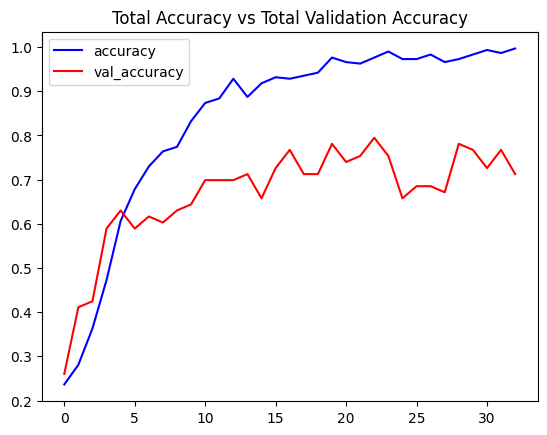

In [33]:
# Visualize the the training and validation accuracy metrices
plot_metric('accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')








**Implement the LRCN Approach**






To implement our LRCN architecture, we will use time-distributed Conv2D layers which will be followed by NaxP001ing2D and Dropout layers.
The feature extracted from the conv2D layers will be then flattened using the Flatten layer and will be fed to a layer The Dense layer with
softmax activation will then use the output from the layer to predict the action being performed.

In [39]:
#construct the model

def create_LRCN_model():
  model = Sequential()
  #Define the model Architecture
  model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                            input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

  model.add(TimeDistributed(MaxPooling2D((4, 4))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((4, 4))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((2, 2))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((2, 2))))
  #model.add(TimeDistributed(Dropout(0.25)))
  model.add(TimeDistributed(Flatten()))

  model.add(LSTM(32))

  model.add(Dense(len(CLASSES_LIST), activation='softmax'))
  #Display the model summary
  model.summary()
  #Return the LRCN model
  return model

**Check the model structure**

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed_15                  │ (None, 20, 64, 64, 16)      │             448 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_16                  │ (None, 20, 16, 16, 16)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_17                  │ (None, 20, 16, 16, 16)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_18                  │ (None, 20, 16, 16, 32)      │           4,640 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_19                  │ (None, 20, 4, 4, 32)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_20                  │ (None, 20, 4, 4, 32)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_21                  │ (None, 20, 4, 4, 64)        │          18,496 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_22                  │ (None, 20, 2, 2, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_23                  │ (None, 20, 2, 2, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_24                  │ (None, 20, 2, 2, 64)        │          36,928 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_25                  │ (None, 20, 1, 1, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_26                  │ (None, 20, 64)              │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │             132 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73,060 (285.39 KB)

 Trainable params: 73,060 (285.39 KB)

 Non-trainable params: 0 (0.00 B)

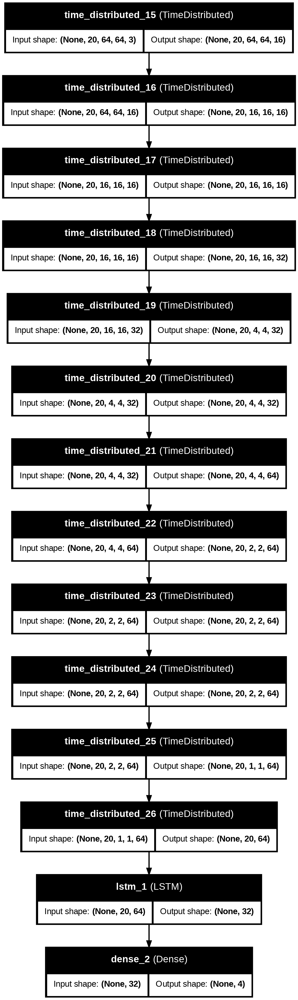

In [41]:


# Create an instance of the LRCN model
LRCN_model = create_LRCN_model()

# Plot the structure of the constructed LRCN model
plot_model(LRCN_model, to_file='LRCN_model_structure_plot.png', show_shapes=True, show_layer_names=True)


compile and train model

In [42]:
#create an instance of early stopping callback
early_Stopping_callback = EarlyStopping(monitor='val_loss', patience=15, mode='min', restore_best_weights=True)

#compile the model and specify the loss function, optimizer and metrics values to the model
LRCN_model.compile(loss="categorical_crossentropy", optimizer="Adam", metrics=["accuracy"])


#start training the model
LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs= 70, batch_size = 4, shuffle= True, validation_split=0.2, callbacks=[early_Stopping_callback])

Epoch 1/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 59s 563ms/step - accuracy: 0.2920 - loss: 1.4115 - val_accuracy: 0.4658 - val_loss: 1.3732
Epoch 2/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 86s 616ms/step - accuracy: 0.3430 - loss: 1.3327 - val_accuracy: 0.4658 - val_loss: 1.2134
Epoch 3/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 85s 667ms/step - accuracy: 0.4232 - loss: 1.2421 - val_accuracy: 0.4247 - val_loss: 1.2186
Epoch 4/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 76s 584ms/step - accuracy: 0.5039 - loss: 1.1516 - val_accuracy: 0.5205 - val_loss: 1.1010
Epoch 5/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 46s 634ms/step - accuracy: 0.5665 - loss: 1.0206 - val_accuracy: 0.5068 - val_loss: 1.0335
Epoch 6/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 52s 715ms/step - accuracy: 0.6280 - loss: 0.9076 - val_accuracy: 0.5890 - val_loss: 0.9816
Epoch 7/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 77s 654ms/step - accuracy: 0.7029 - loss: 0.7705 - val_accuracy: 0.6575 - val_loss: 0.8616
Epoch 8/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 40s 550ms/step - accuracy: 0.7059 - loss: 0.6699 - val_accu

***Evaluate the trained model***

In [43]:
#evaluate the trained model
Model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 583ms/step - accuracy: 0.9309 - loss: 0.3078


**SAVE THE MODEL**

In [44]:
#GET the loss and accuracy from model_evaluation_history
model_evaluation_loss, model_evaluation_accuracy = Model_evaluation_history
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
model_file_name = f'LRCN_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
LRCN_model.save(model_file_name)

**PLOT THE MODEL LOSS AND ACCURACY CURVES**

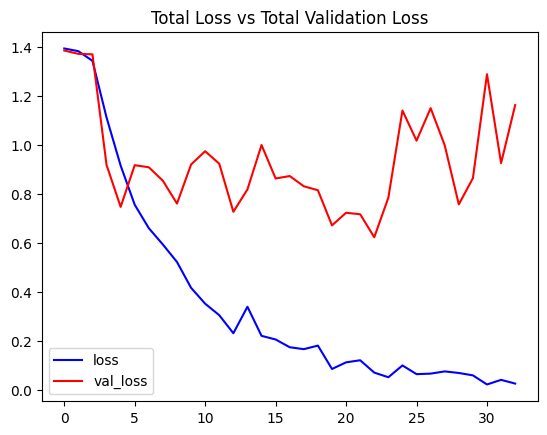

In [46]:
#visualize the training and validation loss metrices
plot_metric('loss', 'val_loss', 'Total Loss vs Total Validation Loss')


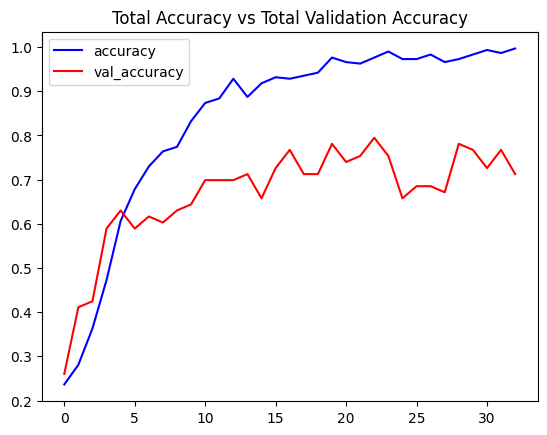

In [47]:

#visualize the training and validation accuracy metrices
plot_metric('accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

**Test the best performing Model on a youtube videos**

From the results, it seems that the LRCN model performed significantly well for a small number of classes. so in this step, we will put the
model to test on some youtube videos.

# Create a Function to Download YouTube Videos:
we will create a function to download the YouTube videos first using pafy library. The library only requires a URL
o a video to download it along with its associated metadata like the title of the video.

In [49]:
def download_youtube_videos(youtube_video_url, output_directory):
  # Create a video object using the pafy library.
  video = pafy.new(youtube_video_url)
  #Retrive the tittle of the video
  title = video.title
  #get the best available quality object for the video
  video_best = video.getbest()
  #construct the output file path
  output_file_path = f"{output_directory}/{title}.mp4"
  #Download the youtube video
  video_best.download(filepath=output_file_path, quiet=True)
  #return the video title
  return title

# Download a Test Video:
Now we will utilize the function created above to download a youtube video on which the LRCN model will be
tested.

In [51]:
!pip install --upgrade youtube-dl

In [59]:
# Discard the output of this cell.
#%capture

# Install the required libraries.
!pip install pafy youtube-dl moviepy

In [60]:
import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

# Upgrade youtube-dl and reinstall pafy to potentially fix the error
!pip install --upgrade youtube-dl
!pip install --upgrade pafy

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [61]:
#Make the output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

#Download a test video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=8u0qjmHIOcE', test_videos_directory)
#Get the youtube video path we just downloaded
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

[debug] Encodings: locale UTF-8, fs utf-8, out UTF-8, pref UTF-8
[debug] youtube-dl version 2021.12.17
[debug] Python version 3.10.12 (CPython) - Linux-6.1.85+-x86_64-with-glibc2.35
[debug] exe versions: ffmpeg 4.4.2, ffprobe 4.4.2
[debug] Proxy map: {'colab_language_server': '/usr/colab/bin/language_service'}
ERROR: Unable to extract uploader id; please report this issue on https://yt-dl.org/bug . Make sure you are using the latest version; see  https://yt-dl.org/update  on how to update. Be sure to call youtube-dl with the --verbose flag and include its complete output.
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/youtube_dl/YoutubeDL.py", line 815, in wrapper
    return func(self, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/youtube_dl/YoutubeDL.py", line 836, in __extract_info
    ie_result = ie.extract(url)
  File "/usr/local/lib/python3.10/dist-packages/youtube_dl/extractor/common.py", line 534, in extract
    ie_result = 

Error downloading video: ERROR: Unable to extract uploader id; please report this issue on https://yt-dl.org/bug . Make sure you are using the latest version; see  https://yt-dl.org/update  on how to update. Be sure to call youtube-dl with the --verbose flag and include its complete output.


In [65]:
!pip install -U yt-dlp


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.1/172.1 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 43.4 MB/s eta 0:00:00


In [66]:
import yt_dlp

def download_youtube_videos(url, output_dir):
    ydl_opts = {
        'outtmpl': f'{output_dir}/%(title)s.%(ext)s',
        'format': 'bestvideo+bestaudio/best',
        'merge_output_format': 'mp4',
    }
    with yt_dlp.YoutubeDL(ydl_opts) as ydl:
        info = ydl.extract_info(url, download=True)
        return info['title']


In [67]:
import os

# Make the output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

# Download a test video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=8u0qjmHIOcE', test_videos_directory)

# Get the YouTube video path we just downloaded
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'


[youtube] Extracting URL: https://www.youtube.com/watch?v=8u0qjmHIOcE
[youtube] 8u0qjmHIOcE: Downloading webpage
[youtube] 8u0qjmHIOcE: Downloading ios player API JSON
[youtube] 8u0qjmHIOcE: Downloading mweb player API JSON
[youtube] 8u0qjmHIOcE: Downloading player 62ccfae7
[youtube] 8u0qjmHIOcE: Downloading m3u8 information
[info] 8u0qjmHIOcE: Downloading 1 format(s): 134+251
[download] Destination: test_videos/Test Video.f134.mp4
[download] 100% of  792.25KiB in 00:00:00 at 4.12MiB/s   
[download] Destination: test_videos/Test Video.f251.webm
[download] 100% of   14.02KiB in 00:00:00 at 106.27KiB/s 
[Merger] Merging formats into "test_videos/Test Video.mp4"
Deleting original file test_videos/Test Video.f134.mp4 (pass -k to keep)
Deleting original file test_videos/Test Video.f251.webm (pass -k to keep)


# Create a Function To Perform Action Recognition on Videos
Next, we will create a function that will simply read a video frame by frame from the path passed in as an argument and
will perform action recognition on video and save the results.

In [68]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
  # Initialize the VideoCapture object to read from the video file.
  video_reader = cv2.VideoCapture(video_file_path)
  #get widht and heigth of the video
  original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
  original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
  #initialize the videoWriter object to store the output video in the disk
  video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                30, (original_video_width, original_video_height))
  #declare a queue to store video frames
  frames_queue = deque(maxlen=SEQUENCE_LENGTH)
  #initialize variable to store the predicted action being performed in the video
  predicted_class_name=''
  #iterate untile the video is accessed successfully
  while video_reader.isOpened():
    #read the frame
    ok, frame = video_reader.read()
    #check if frame is not read properly then break the loop
    if not ok:
      break
    #resize the frame to fixed dimension
    resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
    #Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and
    normalized_frame = resized_frame / 255
    #Append the normalized frame into the frames queue
    frames_queue.append(normalized_frame)
    #Check if the number of frames in the queue are equal to the fixed sequence length
    if len(frames_queue) == SEQUENCE_LENGTH:
      #Pass the normalized frames to the model and get the predicted probabilities
      predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis= 0 ))[0]
      #Get the index of class with highest probability
      predicted_label = np.argmax(predicted_labels_probabilities)
      #Get the class name using the retrieved index
      predicted_class_name = CLASSES_LIST[predicted_label]

    #write the predicted class name on top of the frame
    cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    #write the frame into the disk using the videoWriter object
    video_writer.write(frame)
  #release the video capture object and video writer object
  video_reader.release()
  video_writer.release()


# Perform Action Recognition on the Test Video
Now we will utilize the function created above to perform action recognition on the test video we had downloaded using
the function and display the output video with the predicted action overlayed on it.

In [70]:
#Construct the output video path
output_video_file_path = f'{test_videos_directory}/{video_title}-output-video.mp4'

#preform action recognition on the test video
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

#Display the output video
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300, 300)).ipython_display() # Changed target_resolution to (300, 300)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━

Moviepy - Done !
Moviepy - video ready __temp__.mp4


# Create a Function To Perform a Single Prediction on Videos
Now we create a function that will perform a single prediction for the complete videos. We will extract evenly distributed N (SEQUENCE_LENGTH)
frames from the entire video and pass them to the LRCN model. This approach is really useful when you are working with videos containing only
one activity as it saves unnecessary computations and time in that scenario.

In [63]:
from ctypes import resize
def predict_single_action(video_file_path, SEQUENCE_LENGTH):
  #Initialize the VideoCapture object to read from the video file.
  video_reader = cv2.VideoCapture(video_file_path)
  #Get the width and height of the video
  original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
  original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
  #Declare a list to store video frames we will extract.
  frames_list = []
  ## Initialize a variable to store the predicted action being performed in the video.
  predicted_class_name = ''
  # Get the number of frames in the video.
  video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
  # Calculate the interval after which frames will be added to the list.
  skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
  # Iterate through the video frames.
  for frame_counter in range(SEQUENCE_LENGTH):
    #set the current frame position of the video
    video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
    # Read a frame.
    success, frame = video_reader.read()
    #Check if frame is not read properly then break the loop.
    if not success:
      break
    # Resize the Frame to fixed Dimensions.
    resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
    # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
    normalized_frame = resized_frame / 255
    # Appending the pre-processed frame into the frames list
    frames_list.append(normalized_frame)
  # Passing the pre-processed frames to the model and get the predicted probabilities.
  predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_list, axis=0))[0]
  #Get the index of class with highest probability.
  predicted_label = np.argmax(predicted_labels_probabilities)
  #Get the class name using the retrieved index.
  predicted_class_name = CLASSES_LIST[predicted_label]

  # Display the predicted action along with the prediction confidence.
  print(f'Action Predicted: {predicted_class_name}\nConfidence:{predicted_labels_probabilities[predicted_label]}')
  #release the video capture object
  video_reader.release()
 # return predicted_class_name

# Perform Single Prediction on a Test Video
Now we will utilize the function created above to perform a single prediction on a complete youtube test video that
we will download using the function , we had created above.

In [ ]:
#Download the youtube video.
video_title = download_youtube_videos('https://www.youtube.com/watch?v=8u0qjmHIOcE', test_videos_directory)

# Construct tihe nput youtube video path
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

# Perform single action recognition prediction on the test video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

#Display the input video.
VideoClip(input_video_file_path, audio=False, target_resolution=(300,)).ipython_display()